## Импорт

In [ ]:
pip install pandas

In [ ]:
pip install seaborn

In [ ]:
pip install openpyxl

In [ ]:
pip install scikit-learn

In [ ]:
pip install xgboost

In [ ]:
pip install tensorflow

In [223]:
pip install hyperopt

     ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
      --------------------------------------- 0.0/1.6 MB 1.3 MB/s eta 0:00:02
     -- ------------------------------------- 0.1/1.6 MB 1.3 MB/s eta 0:00:02
     ----- ---------------------------------- 0.2/1.6 MB 1.7 MB/s eta 0:00:01
     --------- ------------------------------ 0.4/1.6 MB 2.1 MB/s eta 0:00:01
     -------------- ------------------------- 0.6/1.6 MB 2.6 MB/s eta 0:00:01
     --------------------------- ------------ 1.1/1.6 MB 4.0 MB/s eta 0:00:01
     ---------------------------------------  1.6/1.6 MB 5.0 MB/s eta 0:00:01
     ---------------------------------------- 1.6/1.6 MB 5.0 MB/s eta 0:00:00
     ---------------------------------------- 0.0/200.5 kB ? eta -:--:--
     ------------------------------------- 200.5/200.5 kB 12.7 MB/s eta 0:00:00
     ---------------------------------------- 0.0/840.9 kB ? eta -:--:--
     ---------------------------------- -- 778.2/840.9 kB 16.3 MB/s eta 0:00:01

In [6]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

import scipy.stats as stats
from scipy.stats import boxcox

from sklearn import svm
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import RandomForestRegressor
from sklearn.kernel_approximation import RBFSampler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeRegressor

from xgboost import XGBRegressor

import tensorflow as tf
from keras.layers import Dense
from keras.models import Sequential
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials

In [7]:
sns.set(style='whitegrid', palette='tab10', font_scale=1)

## Загрузка данных

In [3]:
X_bp = pd.read_excel('data/raw/X_bp.xlsx', index_col = 0)
X_nup = pd.read_excel('data/raw/X_nup.xlsx', index_col = 0)

In [8]:
df = pd.concat([X_bp, X_nup], axis=1, join='inner')

In [5]:
df.to_excel('data/processed/df.xlsx')

## Изучение данных

In [6]:
df.sample(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
549,2.603098,1962.195615,1615.096973,90.187869,24.055905,314.414751,98.509144,72.066814,2949.723274,87.797280,90,7.174620,58.400998
817,2.266528,1999.651278,448.772366,110.457519,21.355316,299.428881,660.481156,73.690890,3291.423405,323.865845,90,9.129448,58.605182
990,3.513742,1912.873673,535.325944,115.654547,26.605045,264.335483,350.233827,75.882143,1958.895808,257.193837,90,11.443058,54.362588
645,3.073297,1920.881890,783.077060,130.163998,24.235156,319.182157,239.535319,73.151894,2697.698968,181.319236,90,3.851420,53.582761
779,2.159406,2014.646229,974.189159,104.042877,24.141653,296.632507,667.781436,74.785578,2316.116707,219.179155,90,5.503209,59.222919


In [7]:
df.shape

(1023, 13)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки           

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [10]:
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [11]:
df.duplicated().sum()

0

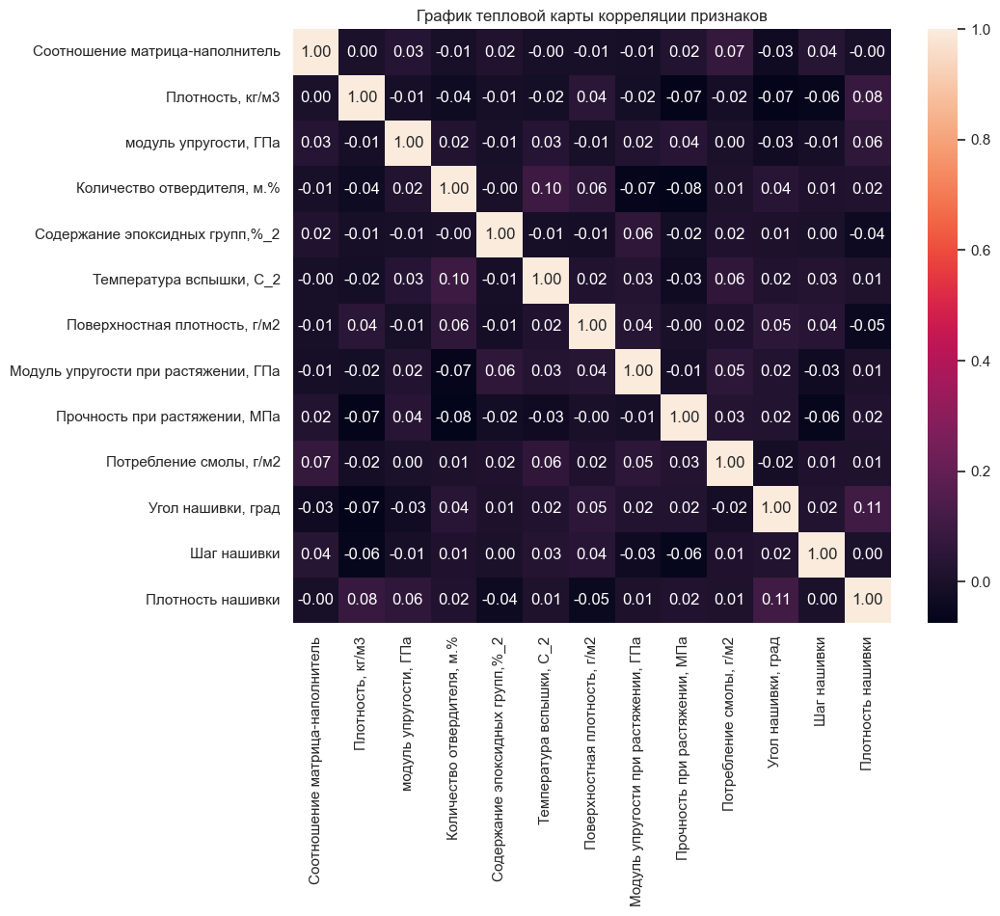

In [12]:
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(method='pearson'), annot=True, fmt='.2f')
plt.title('График тепловой карты корреляции признаков')
plt.show()

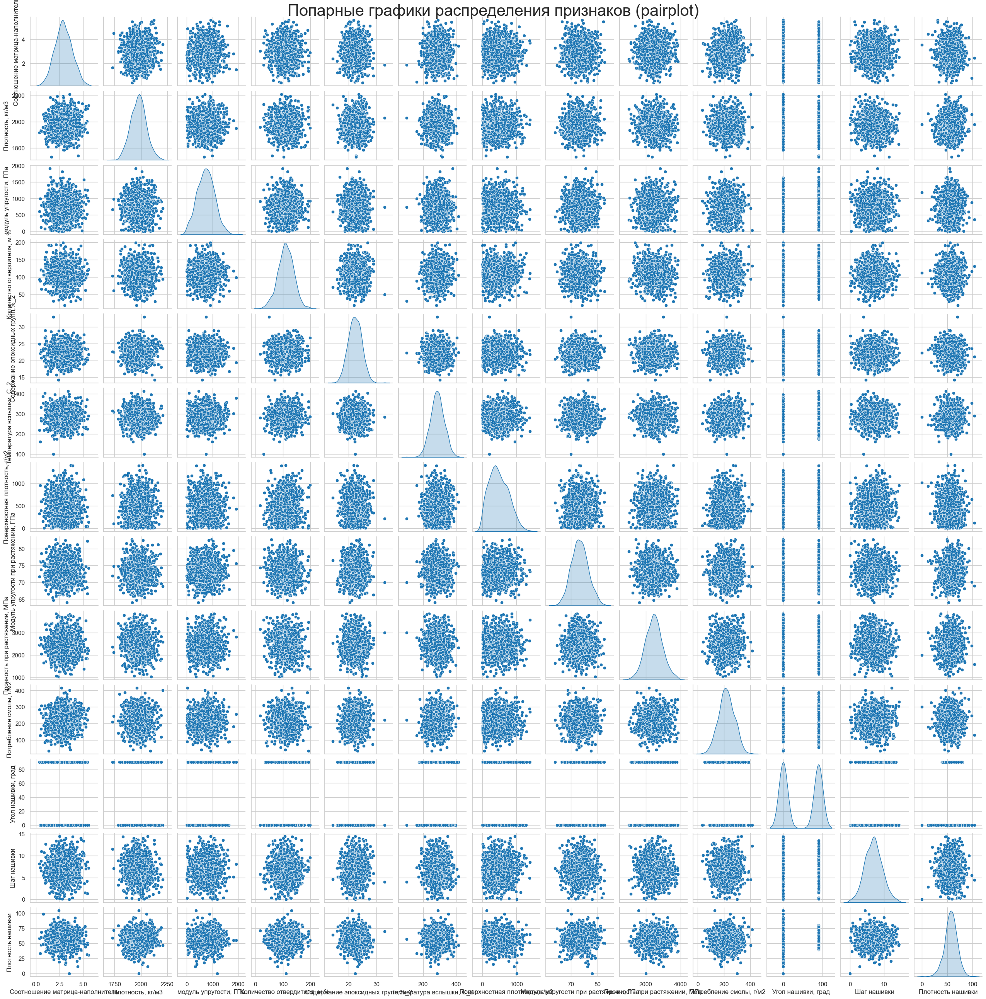

In [13]:
sns.pairplot(df, height=2, aspect=1, diag_kind='kde')
plt.suptitle('Попарные графики распределения признаков (pairplot)', fontsize=30, y=1.0)
plt.show()

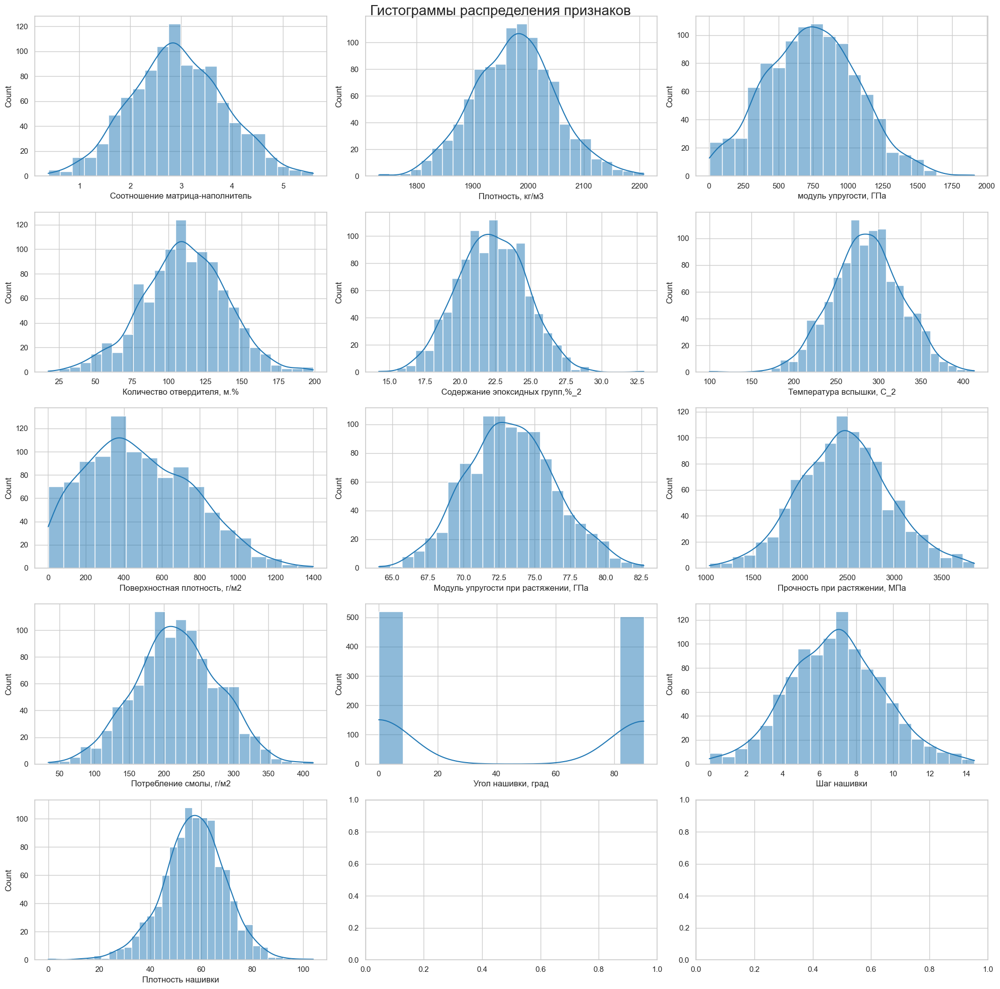

In [449]:
fig, axs = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Гистограммы распределения признаков', fontsize=20)
for i, col in enumerate(df.columns):
    sns.histplot(df, x=col, kde=True, ax=axs[i//3, i%3])
plt.tight_layout()

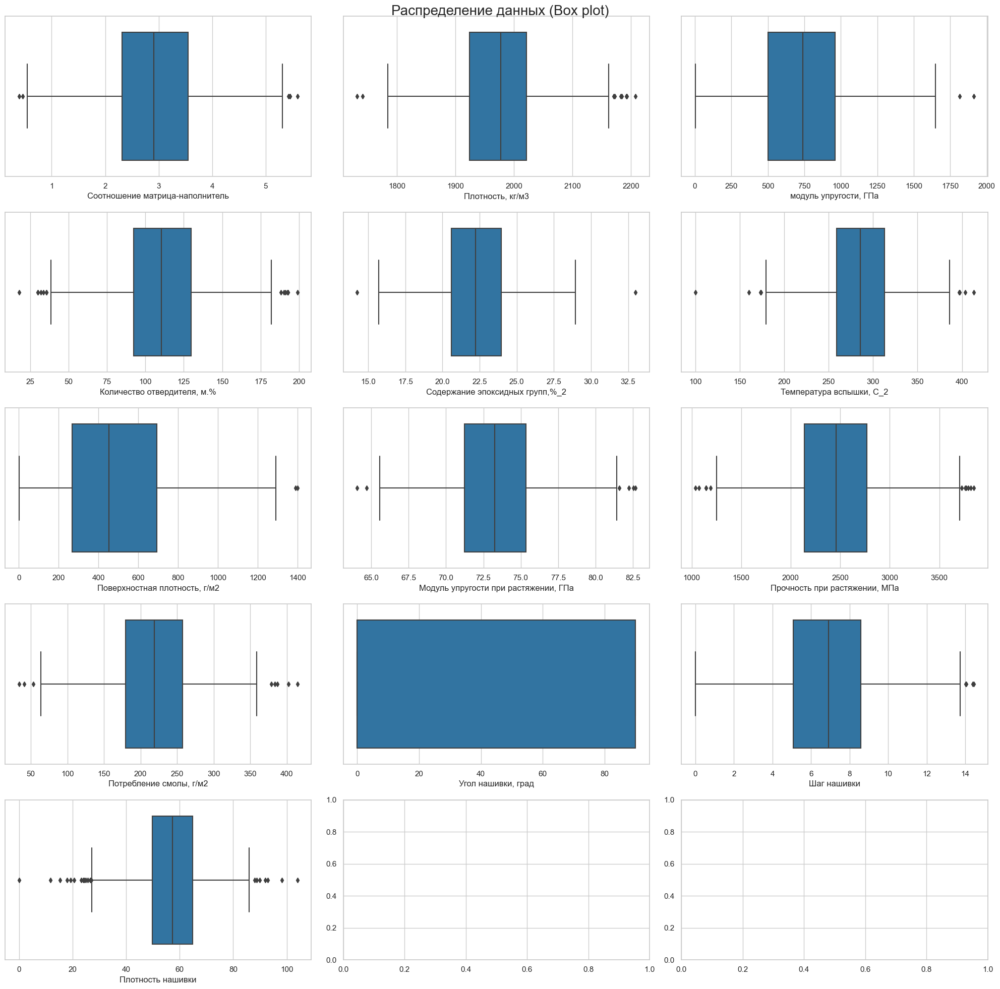

In [450]:
fig, axs = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Распределение данных (Box plot)', fontsize=20)
sns.boxplot(df, x='Соотношение матрица-наполнитель', ax=axs[0, 0])
sns.boxplot(df, x='Плотность, кг/м3', ax=axs[0, 1])
sns.boxplot(df, x='модуль упругости, ГПа', ax=axs[0, 2])
sns.boxplot(df, x='Количество отвердителя, м.%', ax=axs[1, 0])
sns.boxplot(df, x='Содержание эпоксидных групп,%_2', ax=axs[1, 1])
sns.boxplot(df, x='Температура вспышки, С_2', ax=axs[1, 2])
sns.boxplot(df, x='Поверхностная плотность, г/м2', ax=axs[2, 0])
sns.boxplot(df, x='Модуль упругости при растяжении, ГПа', ax=axs[2, 1])
sns.boxplot(df, x='Прочность при растяжении, МПа', ax=axs[2, 2])
sns.boxplot(df, x='Потребление смолы, г/м2', ax=axs[3, 0])
sns.boxplot(df, x='Угол нашивки, град', ax=axs[3, 1])
sns.boxplot(df, x='Шаг нашивки', ax=axs[3, 2])
sns.boxplot(df, x='Плотность нашивки', ax=axs[4, 0])
plt.tight_layout()
plt.show()

In [451]:
# Определение стандартного отклонения
std_dev = df.std()
# Определение границ выбросов для каждого столбца
lower = df.mean() - 3 * std_dev
upper = df.mean() + 3 * std_dev
# Определение выбросов для каждого столбца
outliers = {}
outliers_count = {}
# Вывод выбросов для каждого столбца
for col in df.columns:
    outliers[col] = df.loc[(df[col] < lower[col]) | (df[col] > upper[col]), col]
    outliers_count[col] = len(outliers[col])
    print(col)
    print(outliers[col])
    print(f'Количество выбросов: {outliers_count[col]}')
print('Общее количество выбросов:', sum(outliers_count.values()))

Соотношение матрица-наполнитель
Series([], Name: Соотношение матрица-наполнитель, dtype: float64)
Количество выбросов: 0
Плотность, кг/м3
100    2207.773481
873    1740.657496
918    1731.764635
Name: Плотность, кг/м3, dtype: float64
Количество выбросов: 3
модуль упругости, ГПа
592    1911.536477
770    1815.865170
Name: модуль упругости, ГПа, dtype: float64
Количество выбросов: 2
Количество отвердителя, м.%
257     17.740275
412    198.953207
Name: Количество отвердителя, м.%, dtype: float64
Количество выбросов: 2
Содержание эпоксидных групп,%_2
2      33.000000
298    14.254985
Name: Содержание эпоксидных групп,%_2, dtype: float64
Количество выбросов: 2
Температура вспышки, С_2
0      100.000000
378    160.255843
791    413.273418
Name: Температура вспышки, С_2, dtype: float64
Количество выбросов: 3
Поверхностная плотность, г/м2
692    1399.542362
718    1391.032409
Name: Поверхностная плотность, г/м2, dtype: float64
Количество выбросов: 2
Модуль упругости при растяжении, ГПа
Series(

## Подготовка данных

In [94]:
df_copy = df.copy()

In [15]:
df_copy.sample(5)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
660,3.824246,1999.219950,1399.795415,142.951257,20.925758,286.093012,380.298109,71.881227,2174.166120,280.865657,90,7.627815,64.056357
111,3.615181,1868.412631,800.349064,149.274563,21.775273,282.265660,89.074071,74.170088,2543.236909,156.385476,0,6.583123,50.052099
506,1.847817,2010.572353,481.439638,111.528183,23.124035,230.657508,412.318930,73.347465,2739.929553,244.250886,0,3.206705,62.668060
549,2.603098,1962.195615,1615.096973,90.187869,24.055905,314.414751,98.509144,72.066814,2949.723274,87.797280,90,7.174620,58.400998
71,2.001234,2008.310720,53.582278,111.259275,22.785076,309.579804,887.094295,72.486546,2835.571143,141.598416,0,7.421704,58.238504


## Устранение выбросов

## Выявление выбросов (3-sigma rule) c последующим удалением

In [ ]:
# Определение верхнего и нижнего порога для каждого столбца
lower_bounds = []
upper_bounds = []
for i in range(df_copy.shape[1]):
    col = df_copy.iloc[:,i]
    col_mean, col_std = np.mean(col), np.std(col)
    lower_bound, upper_bound = col_mean - 3*col_std, col_mean + 3*col_std
    lower_bounds.append(lower_bound)
    upper_bounds.append(upper_bound)

# Удаление выбросов
outliers = 1
while outliers > 0:
    outliers = 0
    for i in range(df_copy.shape[1]):
        col = df_copy.iloc[:,i]
        col_outliers = col[(col < lower_bounds[i]) | (col > upper_bounds[i])]
        df_copy = df_copy[(col >= lower_bounds[i]) & (col <= upper_bounds[i])]
        outliers += len(col_outliers)

# Вывод количества выбросов для каждого столбца и общее количество выбросов
print('Количество выбросов для каждого столбца:')
for i, column in enumerate(df_copy.columns):
    col_outliers = len(df_copy[(df_copy[column] < lower_bounds[i]) | (df_copy[column] > upper_bounds[i])])
    print(f'{column}: {col_outliers}')
print(f'Общее количество выбросов: {outliers}')

Количество выбросов для каждого столбца:
Cотн. матрица-наполн.: 0
Плотность: 0
Модуль упругости: 0
Кол-во отвердителя: 0
Сод. эпокс. групп: 0
Темп. вспышки: 0
Пов. плотность: 0
Модуль упругости (раст.): 0
Прочность (раст.): 0
Потр. смолы: 0
Угол нашивки: 0
Шаг нашивки: 0
Плотность нашивки: 0
Общее количество выбросов: 0


In [ ]:
report = pd.DataFrame({
    'Кол-во строк до удаления выбросов': [len(df)],
    'Кол-во строк после удаления выбросов': [len(df_copy)],
    'Кол-во выбросов': [len(df) - len(df_copy)],
    'Доля удаленных строк': [(len(df) - len(df_copy)) / len(df)],
})

print(report)

   Кол-во строк до удаления выбросов  Кол-во строк после удаления выбросов   
0                               1023                                   999  \

   Кол-во выбросов  Доля удаленных строк  
0               24               0.02346  


In [343]:
df_copy.to_excel('data/processed/df_3_sigma_can.xlsx')

## Выявление выбросов (3-sigma rule) c последующей заменой на граничные значения

In [237]:
# Определение верхнего и нижнего порога для каждого столбца
lower_bounds = []
upper_bounds = []
for i in range(df_copy.shape[1]):
    col = df_copy.iloc[:,i]
    col_mean, col_std = np.mean(col), np.std(col)
    lower_bound, upper_bound = col_mean - 3*col_std, col_mean + 3*col_std
    lower_bounds.append(lower_bound)
    upper_bounds.append(upper_bound)

# Замена выбросов на граничные значения
for i, column in enumerate(df_copy.columns):
    df_copy.loc[df_copy[column] < lower_bounds[i], column] = lower_bounds[i]
    df_copy.loc[df_copy[column] > upper_bounds[i], column] = upper_bounds[i]

# Вывод количества выбросов для каждого столбца и общее количество выбросов
print('Количество выбросов для каждого столбца:')
for i, column in enumerate(df_copy.columns):
    col_outliers = len(df_copy[(df_copy[column] < lower_bounds[i]) | (df_copy[column] > upper_bounds[i])])
    print(f'{column}: {col_outliers}')
print(f'Общее количество выбросов: {outliers}')
        
print('Количество строк после замены выбросов:', len(df_copy))

Количество выбросов для каждого столбца:
Cотн. матрица-наполн.: 0
Плотность: 0
Модуль упругости: 0
Кол-во отвердителя: 0
Сод. эпокс. групп: 0
Темп. вспышки: 0
Пов. плотность: 0
Модуль упругости (раст.): 0
Прочность (раст.): 0
Потр. смолы: 0
Угол нашивки: 0
Шаг нашивки: 0
Плотность нашивки: 0
Общее количество выбросов: 0
Количество строк после замены выбросов: 1023


## Выявление выбросов (3-sigma rule) c последующей заменой на медиану

In [261]:
# Определение медианы для каждого столбца
col_medians = []
for i, column in enumerate(df_copy.columns):
    col_median = df_copy[column].median()
    col_medians.append(col_median)

# Замена выбросов на медиану
for i, column in enumerate(df_copy.columns):
    df_copy.loc[df_copy[column] < lower_bounds[i], column] = col_medians[i]
    df_copy.loc[df_copy[column] > upper_bounds[i], column] = col_medians[i]

# Вывод количества выбросов для каждого столбца и общее количество выбросов
print('Количество выбросов для каждого столбца:')
for i, column in enumerate(df_copy.columns):
    col_outliers = len(df_copy[(df_copy[column] < lower_bounds[i]) | (df_copy[column] > upper_bounds[i])])
    print(f'{column}: {col_outliers}')
    
df_outliers = (df_copy.lt(lower_bounds) | df_copy.gt(upper_bounds)).any(axis=1)
num_outliers = df_outliers.sum()
print(f'Общее количество выбросов: {num_outliers}')

print('Количество строк после замены выбросов:', len(df_copy))

Количество выбросов для каждого столбца:
Cотн. матрица-наполн.: 0
Плотность: 0
Модуль упругости: 0
Кол-во отвердителя: 0
Сод. эпокс. групп: 0
Темп. вспышки: 0
Пов. плотность: 0
Модуль упругости (раст.): 0
Прочность (раст.): 0
Потр. смолы: 0
Угол нашивки: 0
Шаг нашивки: 0
Плотность нашивки: 0
Общее количество выбросов: 0
Количество строк после замены выбросов: 1023


## Выявление выбросов (Isolation Forest) c последующим удалением

In [346]:
# Создание объекта модели Isolation Forest
model = IsolationForest(n_estimators=100, contamination='auto', random_state=42)

# Обучение модели на данных
model.fit(df_copy)

# Предсказание аномальности для каждого наблюдения в датафрейме
anomaly_preds = model.predict(df_copy)

# Добавление столбца с предсказанными значениями аномальности в датафрейм
df_copy['is_outlier'] = anomaly_preds

# Определение выбросов
outliers = df_copy[df_copy['is_outlier'] == -1]

# Получение маски выбросов
mask = model.predict(df_copy.drop(['is_outlier'], axis=1)) == -1

# Удаление столбца 'is_outlier'
df_copy.drop('is_outlier', axis=1, inplace=True)

# Использование маски для удаления выбросов
df_copy = df_copy[~mask]

# Определение количества выбросов
num_outliers = outliers.count()[0]

# Определение количества строк после замены выбросов
num_rows = len(df_copy)

# Вывод количества выбросов и количества строк после замены выбросов
print("Количество выбросов:\n", num_outliers)
print("Количество строк после замены выбросов:", num_rows)

Количество выбросов:
 106
Количество строк после замены выбросов: 917


In [347]:
df_copy.to_excel('data/processed/df_IF_can.xlsx')

## Выявление выбросов (Isolation Forest) c последующей заменой на граничные значения

In [ ]:
# Создание объекта модели Isolation Forest
model = IsolationForest(n_estimators=100, contamination='auto', random_state=42)

# Обучение модели на данных
model.fit(df_copy)

# Предсказание аномальности для каждого наблюдения в датафрейме
anomaly_preds = model.predict(df_copy)

# Добавление столбца с предсказанными значениями аномальности в датафрейм
df_copy['is_outlier'] = anomaly_preds

# Определение выбросов
outliers = df_copy[df_copy['is_outlier'] == -1]

# Получение маски выбросов
mask = model.predict(df_copy.drop(['is_outlier'], axis=1)) == -1

# Удаление столбца 'is_outlier'
df_copy.drop('is_outlier', axis=1, inplace=True)

# Замена выбросов на граничные значения
for column in df_copy.columns:
    col_min = df_copy[column].min()
    col_max = df_copy[column].max()
df_copy[column] = df_copy[column].apply(lambda x: col_min if x < col_min else col_max if x > col_max else x)

# Определение количества выбросов
num_outliers = outliers.count()[0]

# Определение количества строк после замены выбросов
num_rows = len(df_copy)

# Вывод количества выбросов и количества строк после замены выбросов
print("Количество выбросов:\n", num_outliers)
print("Количество строк после замены выбросов:", num_rows)

Количество выбросов:
 106
Количество строк после замены выбросов: 1023


## Выявление выбросов (Isolation Forest) c последующей заменой на медиану

In [95]:
    # Определение медианы для каждого столбца
    col_medians = []
    for i, column in enumerate(df_copy.columns):
        col_median = df_copy[column].median()
        col_medians.append(col_median)

    # Создание объекта модели Isolation Forest
    model = IsolationForest(n_estimators=100, contamination='auto', random_state=42)

    # Обучение модели на данных
    model.fit(df_copy)
    
    # Предсказание аномальности для каждого наблюдения в датафрейме
    anomaly_preds = model.predict(df_copy)

    # Добавление столбца с предсказанными значениями аномальности в датафрейм
    df_copy['is_outlier'] = anomaly_preds

    # Определение выбросов
    outliers = df_copy[df_copy['is_outlier'] == -1]

    # Вычисление медианы для каждого столбца
    col_medians = df_copy.median()

    # Вычисление нижних и верхних границ для каждого столбца
    lower_bounds = col_medians - 1.5 * (df_copy.quantile(q=0.75) - df_copy.quantile(q=0.25))
    upper_bounds = col_medians + 1.5 * (df_copy.quantile(q=0.75) - df_copy.quantile(q=0.25))

    # Замена выбросов на медиану
    mask = model.predict(df_copy.drop(['is_outlier'], axis=1)) == -1
    for i, column in enumerate(df_copy.columns):
        df_copy.loc[mask & (df_copy[column] < lower_bounds[i]), column] = col_medians[i]
        df_copy.loc[mask & (df_copy[column] > upper_bounds[i]), column] = col_medians[i]

    # Определение количества выбросов
    num_outliers = outliers.count()[0]

    # Определение количества строк после замены выбросов
    num_rows = len(df_copy)

    # Удаление столбца 'is_outlier'
    df_copy.drop('is_outlier', axis=1, inplace=True)
    
    # Вывод количества выбросов и количества строк после замены выбросов
print("Количество выбросов:\n", num_outliers)
print("Количество строк после замены выбросов:", num_rows)

Количество выбросов:
 106
Количество строк после замены выбросов: 1023


In [97]:
df_copy.to_excel('data/processed/df_IF_med.xlsx')

In [110]:
df_copy.shape

(1023, 13)

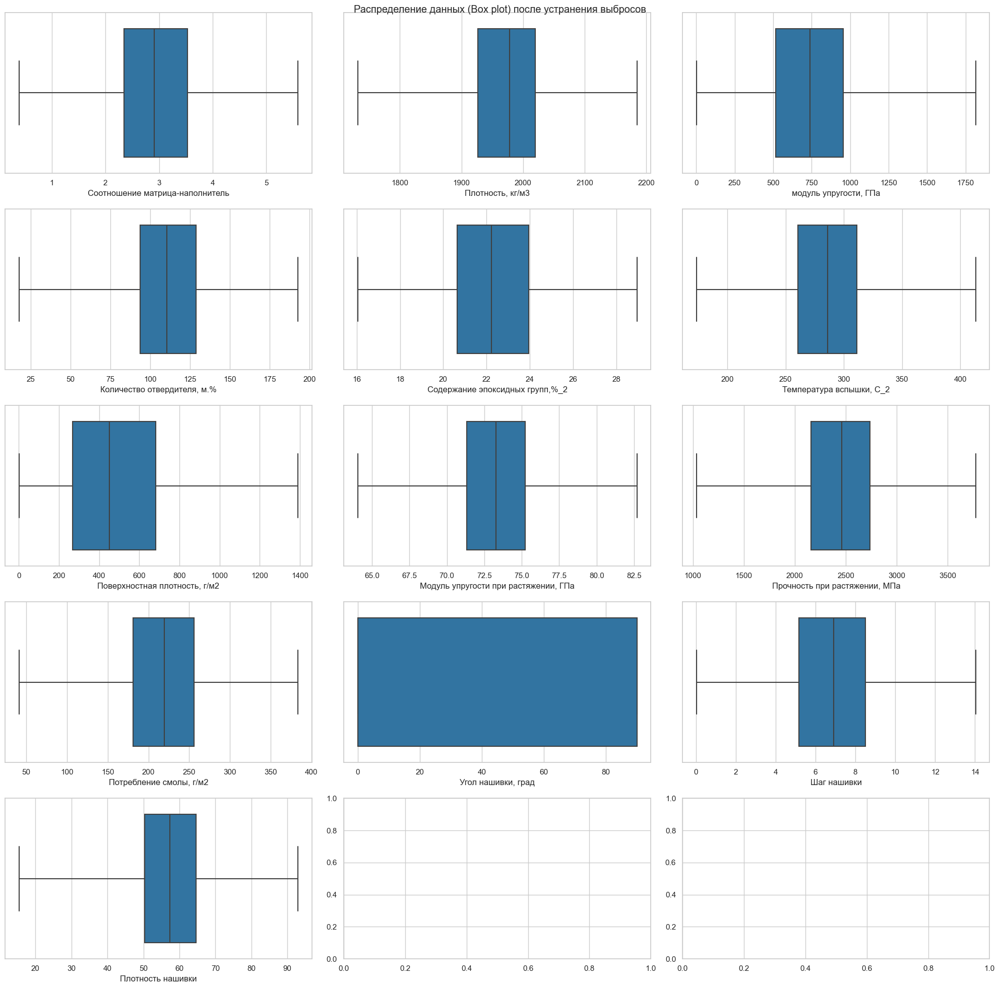

In [99]:
fig, axs = plt.subplots(5, 3, figsize=(20, 20))
fig.suptitle('Распределение данных (Box plot) после устранения выбросов')
sns.boxplot(df_copy, x='Соотношение матрица-наполнитель', ax=axs[0, 0], whis = 3)
sns.boxplot(df_copy, x='Плотность, кг/м3', ax=axs[0, 1], whis = 3)
sns.boxplot(df_copy, x='модуль упругости, ГПа', ax=axs[0, 2], whis = 3)
sns.boxplot(df_copy, x='Количество отвердителя, м.%', ax=axs[1, 0], whis = 3)
sns.boxplot(df_copy, x='Содержание эпоксидных групп,%_2', ax=axs[1, 1], whis = 3)
sns.boxplot(df_copy, x='Температура вспышки, С_2', ax=axs[1, 2], whis = 3)
sns.boxplot(df_copy, x='Поверхностная плотность, г/м2', ax=axs[2, 0], whis = 3)
sns.boxplot(df_copy, x='Модуль упругости при растяжении, ГПа', ax=axs[2, 1], whis = 3)
sns.boxplot(df_copy, x='Прочность при растяжении, МПа', ax=axs[2, 2], whis = 3)
sns.boxplot(df_copy, x='Потребление смолы, г/м2', ax=axs[3, 0], whis = 3)
sns.boxplot(df_copy, x='Угол нашивки, град', ax=axs[3, 1], whis = 3)
sns.boxplot(df_copy, x='Шаг нашивки', ax=axs[3, 2], whis = 3)
sns.boxplot(df_copy, x='Плотность нашивки', ax=axs[4, 0], whis = 3)
plt.tight_layout()
plt.show()

In [53]:
df_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.933248,0.872532,0.389403,2.343858,2.906878,3.543610,5.591742
"Плотность, кг/м3",1023.0,1975.358870,70.162556,1731.764635,1926.439934,1977.621657,2020.056957,2192.738783
"модуль упругости, ГПа",1023.0,741.237282,318.053625,2.436909,510.752290,739.664328,956.576762,1815.865170
"Количество отвердителя, м.%",1023.0,110.561361,26.500521,17.740275,93.162486,110.564840,129.000000,192.851702
"Содержание эпоксидных групп,%_2",1023.0,22.261365,2.338619,15.695894,20.626387,22.230744,23.956458,33.000000
"Температура вспышки, С_2",1023.0,285.696510,39.048215,173.484920,259.487105,285.896812,311.722658,413.273418
"Поверхностная плотность, г/м2",1023.0,477.510438,274.564127,0.603740,266.816645,451.864365,684.510709,1391.032409
"Модуль упругости при растяжении, ГПа",1023.0,73.290801,3.005768,64.054061,71.305491,73.268805,75.296923,82.682051
"Прочность при растяжении, МПа",1023.0,2463.106840,453.546686,1036.856605,2153.995024,2459.524526,2750.350267,3817.269484
"Потребление смолы, г/м2",1023.0,218.747714,56.763307,41.048278,180.596397,219.198882,256.402988,383.663401


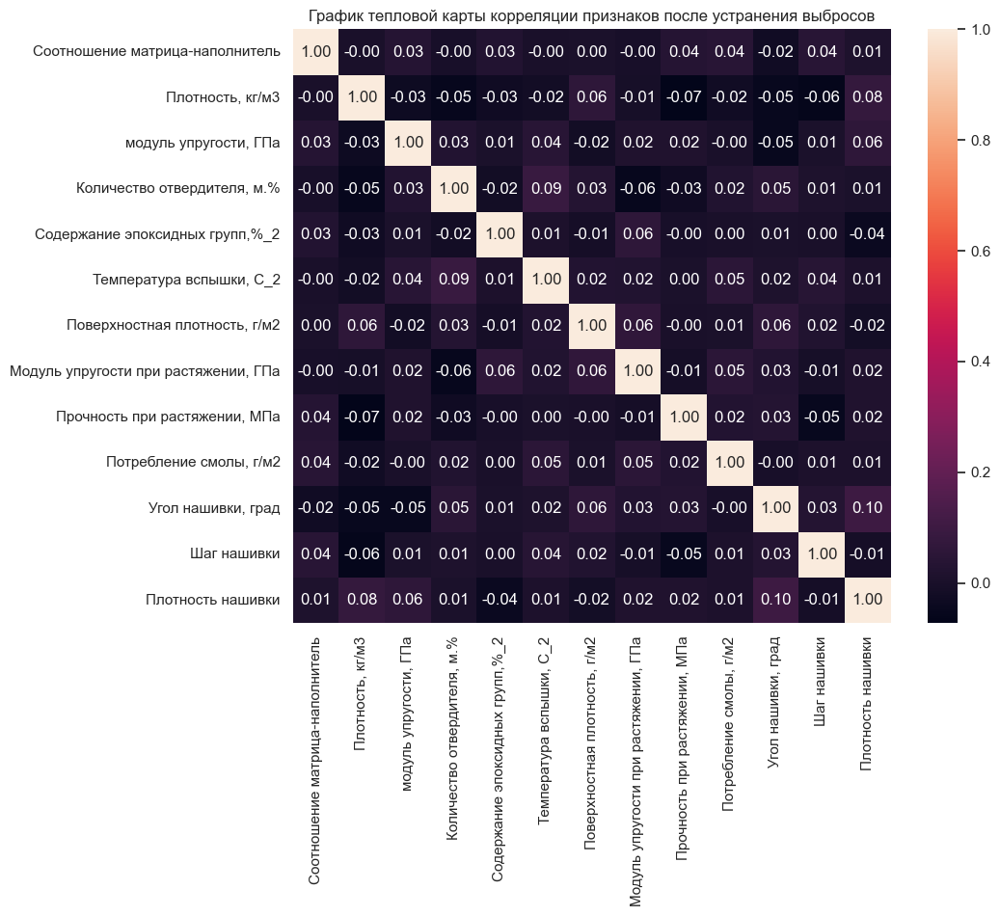

In [54]:
plt.figure(figsize=(10, 8))
sns.heatmap(df_copy.corr(method='pearson'), annot=True, fmt='.2f')
plt.title('График тепловой карты корреляции признаков после устранения выбросов')
plt.show()

In [55]:
X_cor_new = df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1).values
y_cor_new = df_copy[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']].values

# Создание экземпляра XGBRegressor
regressor = XGBRegressor()

# Кросс-валидация
scores = cross_val_score(regressor, X_cor_new, y_cor_new, cv=5, scoring='neg_mean_absolute_error')
mean_score = np.mean(scores)

print('Средняя оценка MAE:', mean_score)

Средняя оценка MAE: -136.92407867950925


In [56]:
df_copy = pd.read_excel('data/processed/df_IF_med.xlsx', index_col = 0)

## Нормализация

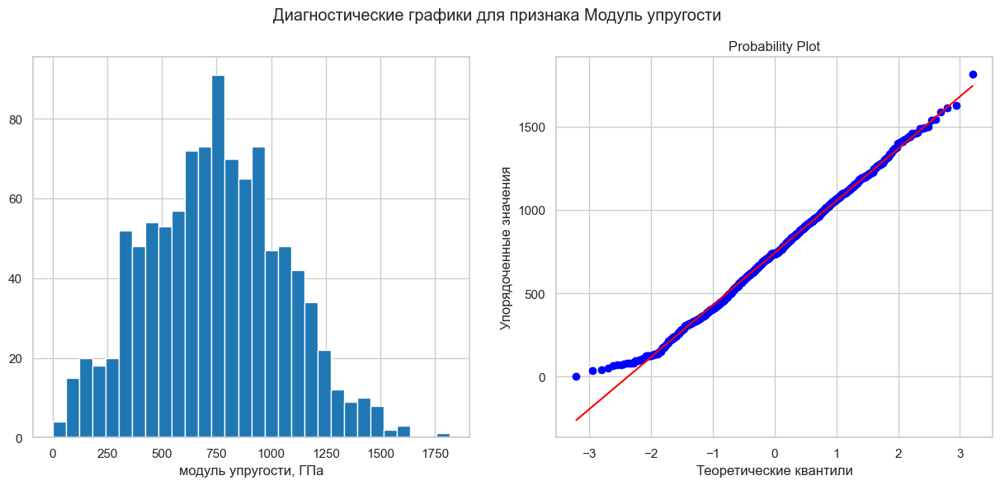

In [100]:
def diagnostic_plots(df_copy, column):
    fig, axes = plt.subplots(figsize=(15,6), ncols=2)
    # Гистограмма
    axes[0].hist(df_copy[column], bins=30)
    axes[0].set_xlabel(column)
    ## Q-Q plot
    stats.probplot(df_copy[column], dist="norm", plot=axes[1])
    axes[1].set_xlabel('Теоретические квантили')
    axes[1].set_ylabel('Упорядоченные значения')
    fig.suptitle('Диагностические графики для признака Модуль упругости')
plt.show()

diagnostic_plots(df_copy, 'модуль упругости, ГПа')

Оптимальное значение λ = 0.8464723147020584


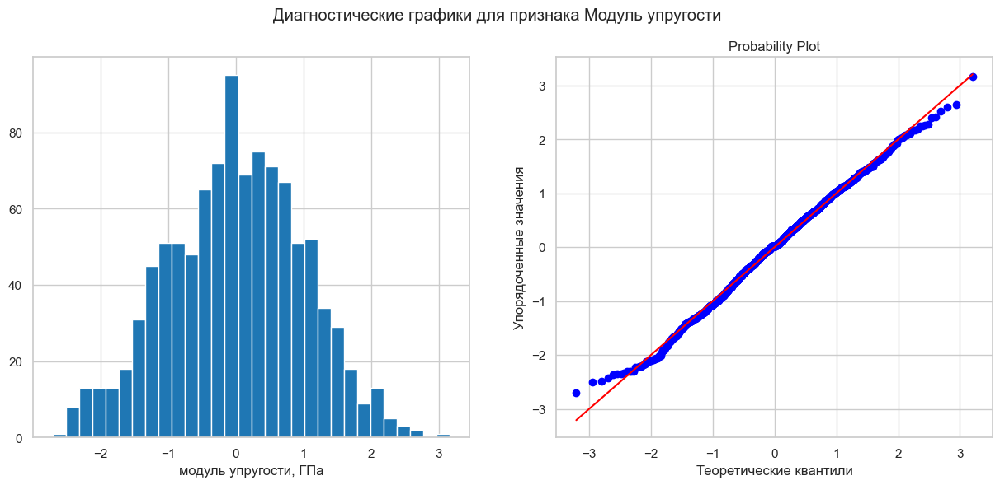

In [101]:
# Применение преобразование Йео-Джонсона
pt = PowerTransformer(method='yeo-johnson')
df_copy[['модуль упругости, ГПа']] = pt.fit_transform(df_copy[['модуль упругости, ГПа']])

# Вывод оптимальное значение λ
print('Оптимальное значение λ = {}'.format(pt.lambdas_[0]))

# Визуализация распределения после преобразования Йео-Джонсона
diagnostic_plots(df_copy, 'модуль упругости, ГПа')

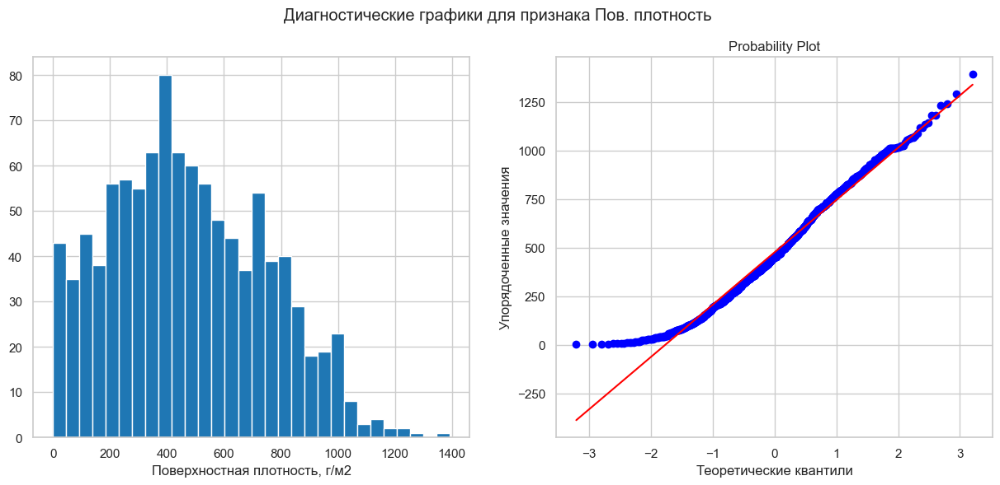

In [102]:
def diagnostic_plots(df_copy, column):
    fig, axes = plt.subplots(figsize=(15,6), ncols=2)
    # Гистограмма
    axes[0].hist(df_copy[column], bins=30)
    axes[0].set_xlabel(column)
    ## Q-Q plot
    stats.probplot(df_copy[column], dist='norm', plot=axes[1])
    axes[1].set_xlabel('Теоретические квантили')
    axes[1].set_ylabel('Упорядоченные значения')
    fig.suptitle('Диагностические графики для признака Пов. плотность')
plt.show()

diagnostic_plots(df_copy, 'Поверхностная плотность, г/м2')

Оптимальное значение λ = 0.6497871979318324


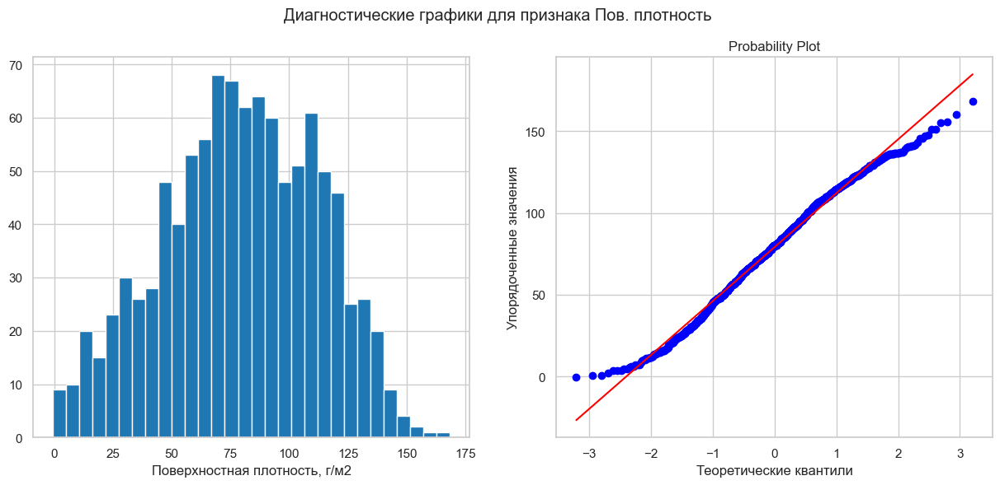

In [103]:
# Применяем преобразование Бокса-Кокса 
df_copy['Поверхностная плотность, г/м2'], param = boxcox(df_copy['Поверхностная плотность, г/м2'])

print('Оптимальное значение λ = {}'.format(param))

# Визуализация распределения после преобразования Бокса-Кокса
diagnostic_plots(df_copy, 'Поверхностная плотность, г/м2')

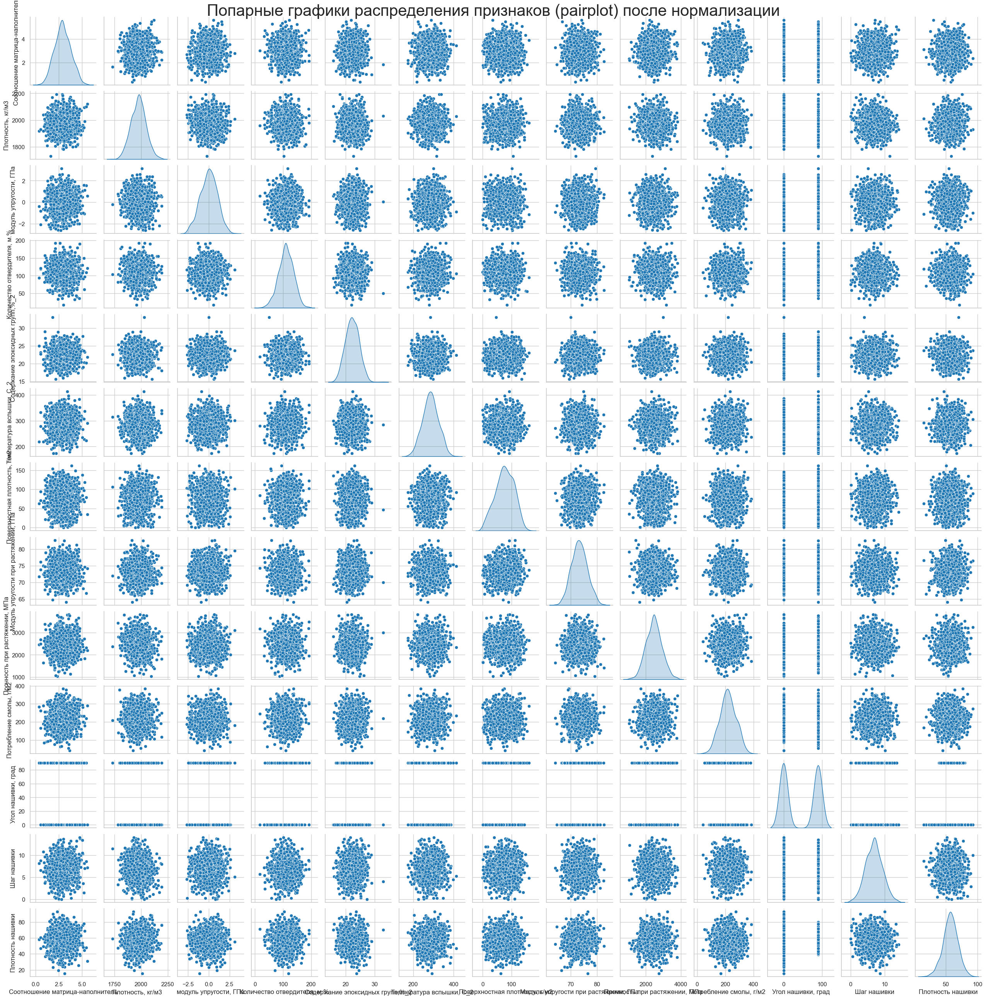

In [30]:
sns.pairplot(df_copy, height=2, aspect=1, diag_kind='kde')
plt.suptitle('Попарные графики распределения признаков (pairplot) после нормализации', fontsize=30, y=1.0)
plt.show()

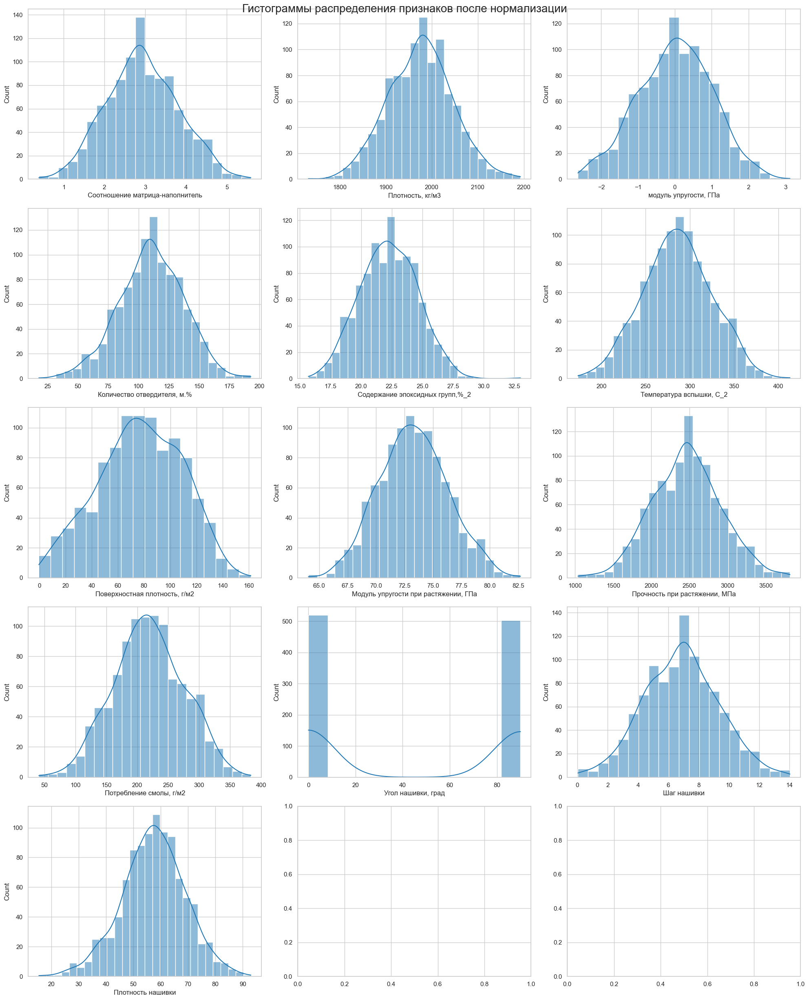

In [31]:
fig, axs = plt.subplots(5, 3, figsize=(20, 25))
fig.suptitle('Гистограммы распределения признаков после нормализации', fontsize=20)
for i, col in enumerate(df_copy.columns):
    sns.histplot(df_copy, x=col, kde=True, ax=axs[i//3, i%3])
plt.tight_layout()

In [61]:
X_cor_new = df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1).values
y_cor_new = df_copy[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']].values

# Создание экземпляра XGBRegressor
regressor = XGBRegressor()

# Кросс-валидация
scores = cross_val_score(regressor, X_cor_new, y_cor_new, cv=5, scoring='neg_mean_absolute_error')
mean_score = np.mean(scores)

print('Средняя оценка MAE:', mean_score)

Средняя оценка MAE: -136.81987832314726


In [62]:
df_copy.to_excel('data/processed/df_IF_med_norm.xlsx')

In [78]:
df_copy = pd.read_excel('data/processed/df_IF_med_norm.xlsx', index_col = 0)

## Определение важности признаков (Feature importance)

In [35]:
columns_to_drop = ['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
X_FI = df_copy.drop(columns_to_drop, axis=1).values
y_FI = df_copy[columns_to_drop].values

# создание модели XGBRegressor
model = XGBRegressor()
model.fit(X_FI, y_FI)

# получение коэфицента важности признаков
importances = model.feature_importances_

# вывод коэфицентов важности признаков
for feature, importance in zip(df_copy.columns, importances):
    if feature not in columns_to_drop:
        print(f'{feature}: {importance}')

Плотность, кг/м3: 0.08776523917913437
модуль упругости, ГПа: 0.09497826546430588
Количество отвердителя, м.%: 0.0863879844546318
Содержание эпоксидных групп,%_2: 0.1021478921175003
Температура вспышки, С_2: 0.1013820618391037
Поверхностная плотность, г/м2: 0.10899581760168076
Потребление смолы, г/м2: 0.13747955858707428


## Применение полиноминальной регрессии

In [36]:
# инициализация StandardScaler
scaler = StandardScaler()

# масштабирование признаков
scaled_features = scaler.fit_transform(df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1))

# создание экземпляра PolynomialFeatures
poly = PolynomialFeatures(degree=5, include_bias=False)

# преобразование df_copy
X_poly = poly.fit_transform(df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1))

# создание списка названий новых признаков
poly_feature_names = poly.get_feature_names_out(df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1).columns)

# создание нового датафрейма с новыми признаками
df_poly = pd.DataFrame(X_poly, columns=poly_feature_names)

# добавление целевых переменных в новый датафрейм
df_poly[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']] = df_copy[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']]

In [37]:
X_cor_new = df_poly.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1).values
y_cor_new = df_poly[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']].values

# создание экземпляра XGBRegressor
regressor = XGBRegressor()

# кросс-валидация
scores = cross_val_score(regressor, X_cor_new, y_cor_new, cv=5, scoring='neg_mean_absolute_error')
mean_score = np.mean(scores)

print('Средняя оценка MAE:', mean_score)

Средняя оценка MAE: -135.45805551439003


In [39]:
corr_matrix = df_poly.corr().abs()
top_10 = corr_matrix[['Соотношение матрица-наполнитель']].sort_values(by=['Соотношение матрица-наполнитель'], ascending=False).head(10)
print(top_10)

                                                    Соотношение матрица-наполнитель
Соотношение матрица-наполнитель                                            1.000000
модуль упругости, ГПа Поверхностная плотность, ...                         0.085104
модуль упругости, ГПа Поверхностная плотность, ...                         0.082614
модуль упругости, ГПа Поверхностная плотность, ...                         0.082338
модуль упругости, ГПа Поверхностная плотность, ...                         0.079021
модуль упругости, ГПа Потребление смолы, г/м2 У...                         0.078648
модуль упругости, ГПа Угол нашивки, град Плотно...                         0.078429
модуль упругости, ГПа Температура вспышки, С_2 ...                         0.077465
модуль упругости, ГПа Температура вспышки, С_2 ...                         0.076891
Плотность, кг/м3 модуль упругости, ГПа Поверхно...                         0.076742


In [40]:
pd.set_option('display.max_colwidth', None)
top_10 = corr_matrix[['Модуль упругости при растяжении, ГПа']].sort_values(by=['Модуль упругости при растяжении, ГПа'], ascending=False).head(10)
print(top_10)

                                                                                                                                 Модуль упругости при растяжении, ГПа
Модуль упругости при растяжении, ГПа                                                                                                                         1.000000
Содержание эпоксидных групп,%_2^2 Температура вспышки, С_2 Поверхностная плотность, г/м2 Потребление смолы, г/м2                                             0.088022
Содержание эпоксидных групп,%_2 Температура вспышки, С_2 Поверхностная плотность, г/м2 Потребление смолы, г/м2                                               0.086507
Содержание эпоксидных групп,%_2^2 Поверхностная плотность, г/м2 Потребление смолы, г/м2                                                                      0.085853
Содержание эпоксидных групп,%_2 Поверхностная плотность, г/м2 Потребление смолы, г/м2                                                                        0.085028
Плот

In [41]:
pd.set_option('display.max_colwidth', None)
top_10 = corr_matrix[['Прочность при растяжении, МПа']].sort_values(by=['Прочность при растяжении, МПа'], ascending=False).head(10)
print(top_10)

                                                                                                         Прочность при растяжении, МПа
Прочность при растяжении, МПа                                                                                                 1.000000
Плотность, кг/м3^3 Количество отвердителя, м.% Шаг нашивки                                                                    0.073547
Плотность, кг/м3                                                                                                              0.072586
Плотность, кг/м3^2                                                                                                            0.071663
Плотность, кг/м3^3                                                                                                            0.070701
Плотность, кг/м3^4                                                                                                            0.069700
Плотность, кг/м3^2 Количество отвердителя, м.% Содержан

## Генерация дополнительных признаков

In [ ]:
#df_copy['Жесткость материала'] = df_copy['Плотность'] / df_copy['Модуль упругости']
#df_copy['Качество отверждения материала'] = (df_copy['Кол-во отвердителя'] / df_copy['Сод. эпокс. групп']) * df_copy['Темп. вспышки']
#df_copy['Общее количество наполнителя'] = df_copy['Плотность'] * (1 - df_copy['Сод. эпокс. групп'])
#df_copy['Потребление отвердителя'] = df_copy['Потр. смолы'] * df_copy['Кол-во отвердителя'] / 100
#df_copy['Средняя плотность нашивки'] = df_copy['Пов. плотность'] / df_copy['Шаг нашивки']
#df_copy['Ср. плотность наполнителя'] = df_copy[['Плотность', 'Пов. плотность']].mean(axis=1)
#df_copy['Доля наполнителя'] = df_copy['Плотность'] / df_copy['Пов. плотность']
#df_copy['Макс. плотность наполнителя'] = df_copy[['Плотность', 'Пов. плотность']].max(axis=1)
#df_copy['Мин. плотность наполнителя'] = df_copy[['Плотность', 'Пов. плотность']].min(axis=1)
#df_copy['Стд. отклонение плотности наполнителя'] = df_copy[['Плотность', 'Пов. плотность']].std(axis=1)
#df_copy['Суммарная доля логарифма наполнителя в матрице'] = np.log(df_copy['Кол-во отвердителя'] / df_copy['Потр. смолы'])
#df_copy['Логарифм_Плотность'] = np.log(df_copy['Плотность'])
#df_copy['Логарифм_Модуль упругости'] = np.log(df_copy['Модуль упругости'])
#df_copy['Логарифм_Кол-во отвердителя'] = np.log(df_copy['Кол-во отвердителя'])
#df_copy['Логарифм_Сод. эпокс. групп'] = np.log(df_copy['Сод. эпокс. групп'])
#df_copy['Логарифм_Темп. вспышки'] = np.log(df_copy['Темп. вспышки'])
#df_copy['Логарифм_Пов. плотность'] = np.log(df_copy['Пов. плотность'])
#df_copy['Логарифм_Потр. смолы'] = np.log(df_copy['Потр. смолы'])
#df_copy['Логарифм_Шаг нашивки'] = np.log(df_copy['Шаг нашивки'])
#df_copy['Логарифм_Плотность нашивки'] = np.log(df_copy['Плотность нашивки'])

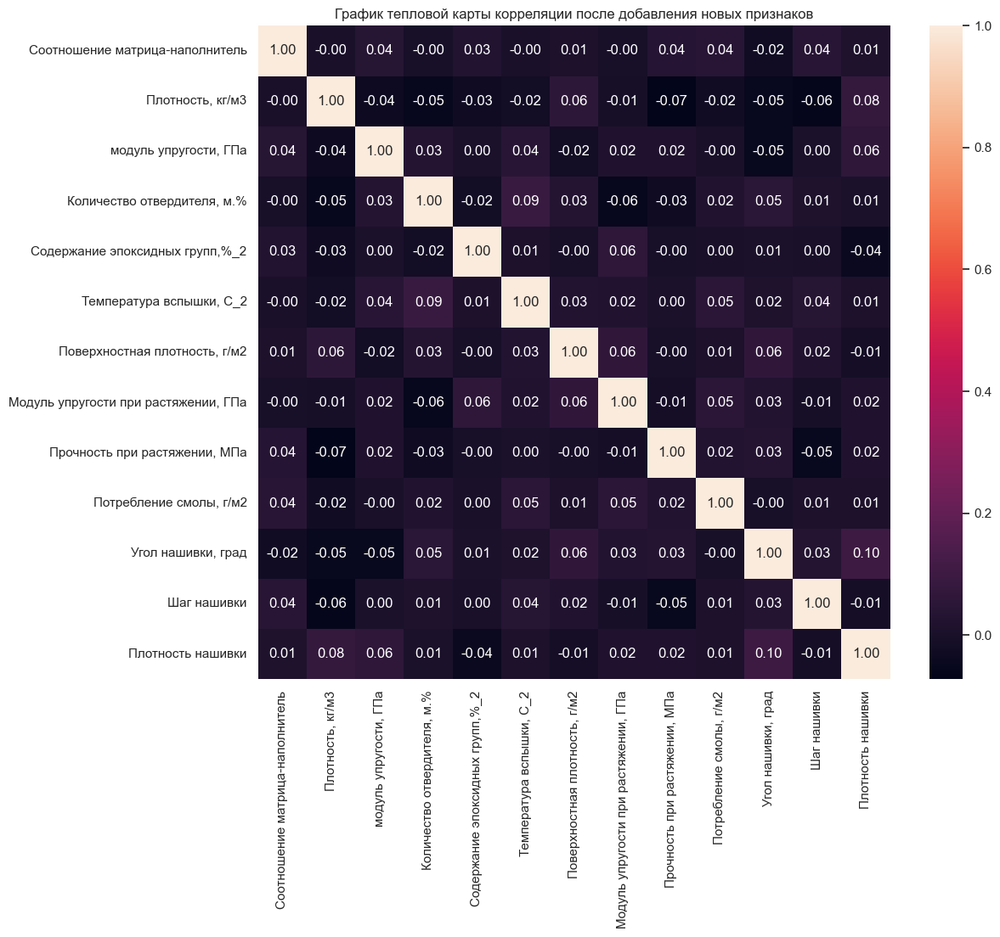

In [42]:
plt.figure(figsize=(12, 10))
sns.heatmap(df_copy.corr(method='pearson'), annot=True, fmt='.2f')
plt.title('График тепловой карты корреляции после добавления новых признаков')
plt.show()

In [43]:
X_cor_new = df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1).values
y_cor_new = df_copy[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']].values

# создание экземпляра XGBRegressor
regressor = XGBRegressor()

# кросс-валидация
scores = cross_val_score(regressor, X_cor_new, y_cor_new, cv=5, scoring='neg_mean_absolute_error')
mean_score = np.mean(scores)

print('Средняя оценка MAE:', mean_score)

Средняя оценка MAE: -136.81987832314726


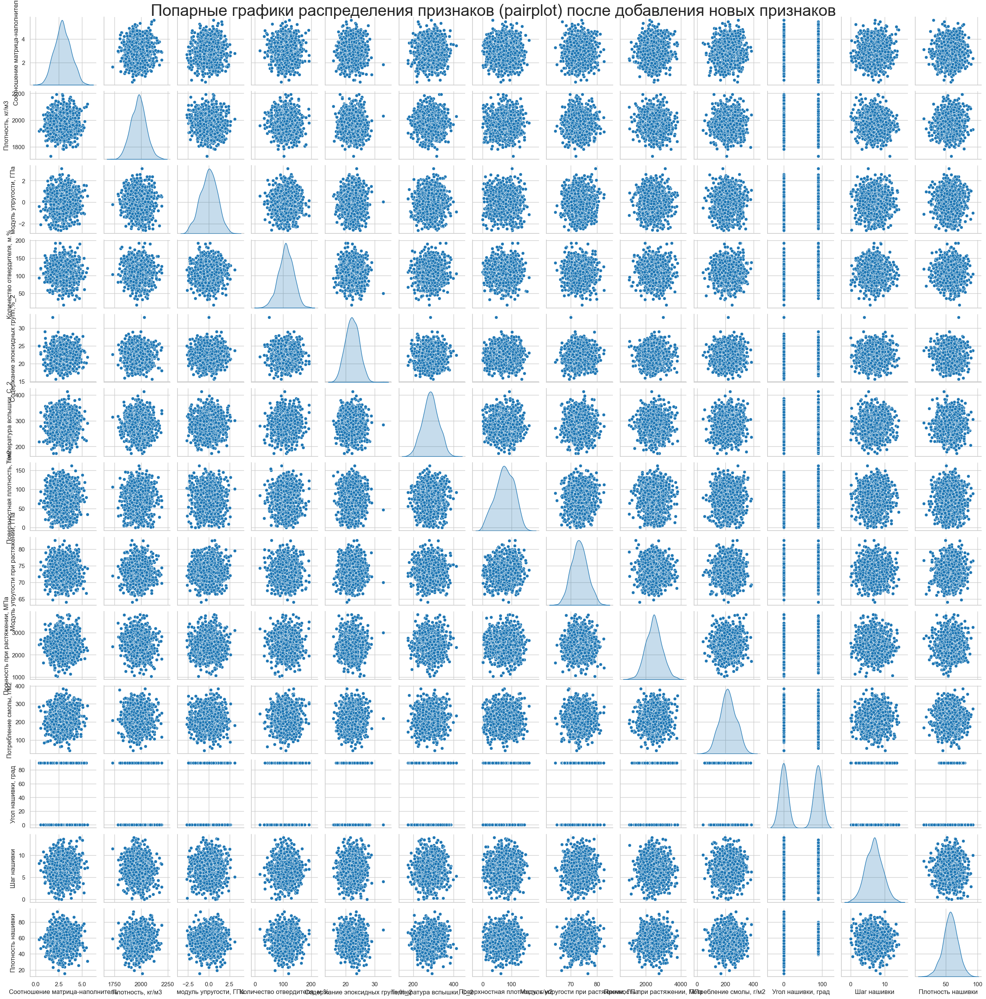

In [44]:
sns.pairplot(df_copy, height=2, aspect=1, diag_kind='kde')
plt.suptitle('Попарные графики распределения признаков (pairplot) после добавления новых признаков', fontsize=30, y=1.0)
plt.show()

## Разделение выборки на обучающую и тестовую

In [86]:
X = df_copy.drop(['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'], axis=1)
y = df_copy[['Соотношение матрица-наполнитель', 'Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

## Масштабирование

## MinMax-масштабирование

In [35]:
# Сохранение названий столбцов обучающей выборки
column_names = X.columns.tolist()
# Создание объекта клzасса MinMaxScaler:
scaler = MinMaxScaler()
# Применение метода fit_transform к обучающей выборке
X = scaler.fit_transform(X)

In [36]:
# Преобразование массива обратно в DataFrame с использованием сохраненных названий столбцов
X = pd.DataFrame(X, columns=column_names)

## Масштабирование данных на основе Z-оценки (StandardScaler)

In [108]:
# Сохранение названий столбцов обучающей выборки
column_names = X.columns.tolist()
# Создание объекта класса StandardScaler:
scaler = StandardScaler()
# Применение метода fit_transform к датасету
X = scaler.fit_transform(X)
# Преобразование массива обратно в DataFrame с использованием сохраненных названий столбцов
X = pd.DataFrame(X, columns=column_names)

In [109]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
"Плотность, кг/м3",1023.0,-3.472838e-18,1.000489,-3.473553,-0.697564,0.032266,0.637376,3.099748
"модуль упругости, ГПа",1023.0,1.736419e-18,1.000489,-2.631042,-0.697803,0.029789,0.688875,3.124499
"Количество отвердителя, м.%",1023.0,-1.562777e-17,1.000489,-3.504327,-0.656870,0.000131,0.696124,3.106754
"Содержание эпоксидных групп,%_2",1023.0,3.820122e-17,1.000489,-2.808788,-0.699464,-0.013100,0.725181,4.594117
"Температура вспышки, С_2",1023.0,0.000000e+00,1.000489,-2.875073,-0.671535,0.005132,0.666839,3.268762
"Поверхностная плотность, г/м2",1023.0,1.562777e-17,1.000489,-2.414500,-0.684669,0.026783,0.784665,2.652575
"Потребление смолы, г/м2",1023.0,1.389135e-17,1.000489,-3.132065,-0.672441,0.007952,0.663698,2.906743
"Угол нашивки, град",1023.0,4.167406e-17,1.000489,-0.983518,-0.983518,-0.983518,1.016758,1.016758
Шаг нашивки,1023.0,-1.041852e-17,1.000489,-2.773232,-0.709777,0.024366,0.677133,2.918992
Плотность нашивки,1023.0,1.041852e-17,1.000489,-3.621331,-0.614538,0.001828,0.630841,3.080183


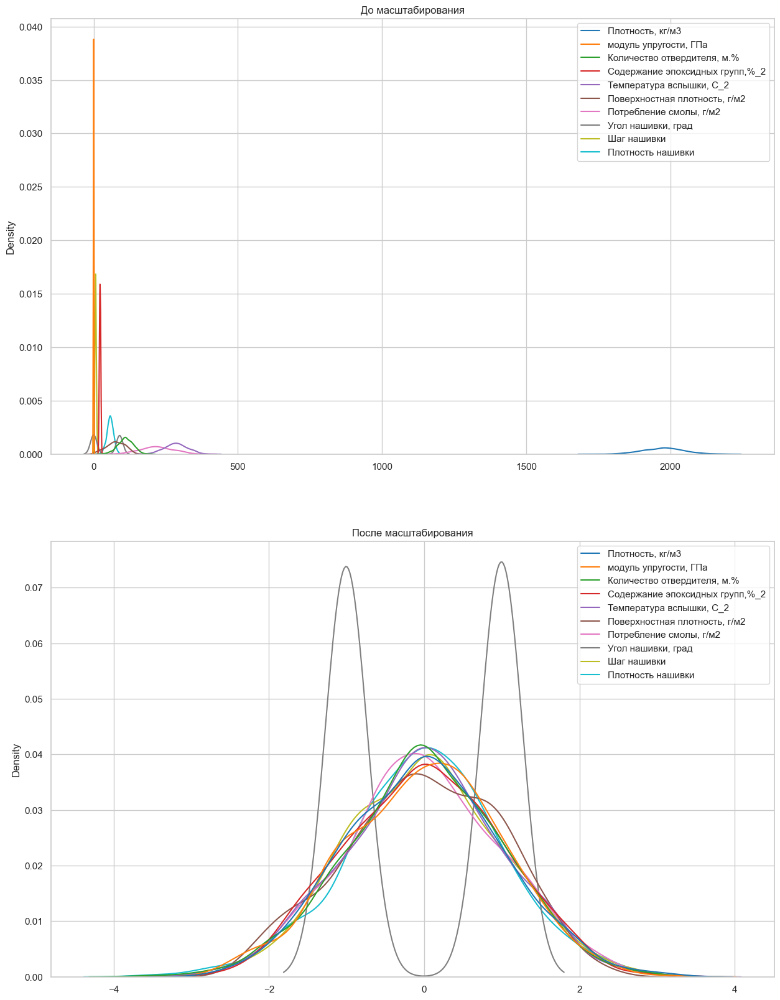

In [91]:
# Построение плотности распределения
def draw_kde(col_list, df_copy, X, label1, label2):
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 20))
    # До масштабирования
    axes[0].set_title(label1)
    sns.kdeplot(data=df_copy[col_list], ax=axes[0])
    # После масштабирования
    axes[1].set_title(label2)
    sns.kdeplot(data=X_train_std[col_list], ax=axes[1])
    plt.show()

draw_kde(['Плотность, кг/м3', 'модуль упругости, ГПа', 'Количество отвердителя, м.%', 'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
          'Поверхностная плотность, г/м2', 'Потребление смолы, г/м2', 'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'], df_copy, X, 'До масштабирования', 'После масштабирования')

## Подбор гиперпараметров

Линейная регрессия

In [25]:
# Определение модели
model = LinearRegression()

# Определение сетки параметров
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False]}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(model, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=5)

# Обучение модели с помощью GridSearchCV
grid_search.fit(X, y)

# Отображение лучших параметров и соответствующего значения метрики
print(f'Лучшие параметры: {grid_search.best_params_}')
print(f'Лучшее значение метрики MAE: {abs(grid_search.best_score_)}')

Лучшие параметры: {'copy_X': True, 'fit_intercept': True}
Лучшее значение метрики MAE: 120.90814144980652


Решающие деревья

In [30]:
# Создание объекта модели
model = DecisionTreeRegressor()

# Определение сетки параметров
param_grid = {'max_depth': [2, 4, 6, 8, 10, None], 
              'min_samples_split': [2, 5, 10, 20, 30],
              'min_samples_leaf': [1, 2, 4, 8, 16]}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(model, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=5)

# Обучение модели с помощью GridSearchCV
grid_search.fit(X, y)

# Отображение лучших параметров и соответствующего значения метрики
print(f'Лучшие параметры: {grid_search.best_params_}')
print(f'Лучшее значение метрики MAE: {grid_search.best_score_}')

Лучшие параметры: {'max_depth': 2, 'min_samples_leaf': 16, 'min_samples_split': 2}
Лучшее значение метрики MAE: -121.78994662184877


Метод опорных векторов для регрессии

In [ ]:
# Создание модели
svm = SVR()

# Определение сетки параметров
param_grid = {'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [2, 3, 4, 5],
    'gamma': ['scale', 'auto']}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(svm, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=5)

# Обучение модели с помощью GridSearchCV
grid_search.fit(X, y)

# Отображение лучших параметров и соответствующего значения метрики
print(f'Лучшие параметры: {grid_search.best_params_}')
print(f'Лучшее значение метрики MAE: {grid_search.best_score_}')

In [ ]:
Лучшие параметры: {'kernel': 'rbf', 'C': 0.1, 'gamma': 1.0}
Лучшее значение метрики MAE: -121.18994662184877

Случайный лес

In [41]:
# Создание объекта модели
model = RandomForestRegressor()

# Определение сетки параметров
param_grid = {'n_estimators': [50, 100, 150, 200], 
              'max_depth': [2, 4, 6, 8, 10, None], 
              'min_samples_split': [2, 5, 10, 20, 30],
              'min_samples_leaf': [1, 2, 4, 8, 16],
              'max_features': ['sqrt', 'log2', None]}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(model, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=5)

# Обучение модели с помощью GridSearchCV
grid_search.fit(X, y)

# Отображение лучших параметров и соответствующего значения метрики
print(f'Лучшие параметры: {grid_search.best_params_}')
print(f'Лучшее значение метрики MAE: {grid_search.best_score_}')

Лучшие параметры: {'max_depth': 2, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 20, 'n_estimators': 50}
Лучшее значение метрики MAE: -120.35939962525431


Градиентный бустинг

In [ ]:
# Создание объекта модели
model = GradientBoostingRegressor()

# Определение сетки параметров
param_grid = {'n_estimators': [50, 100, 150, 200],  
              'max_depth': [2, 4, 6, 8, 10, None], 
              'min_samples_split': [2, 5, 10, 20, 30],
              'min_samples_leaf': [1, 2, 4, 8, 16],
              'max_features': ['sqrt', 'log2', None]}

# Создание объекта GridSearchCV
grid_search = GridSearchCV(model, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=5)

# Обучение модели с помощью GridSearchCV
X = np.array(X)
y = np.array(y[:, 0])
grid_search.fit(X, y)

# Отображение лучших параметров и соответствующего значения метрики
print(f'Лучшие параметры: {grid_search.best_params_}')
print(f'Лучшее значение метрики MAE: {grid_search.best_score_}')

In [ ]:
Лучшие параметры:{'max_depth' : 2, 'max_feature' : 'log2', 'min_samples_leaf' : 1, 'min_samples_split' : 30, 'n_estimators' : 50}
Лучшее значение метрики MAE: 121.78994662184877

XGBRegressor

In [176]:
# Определение модели
model = XGBRegressor()

# Словарь гиперпараметров и диапазоны значений для поиска
param_grid = {'max_depth': [2, 4, 6, 8],
              'n_estimators': [50, 100, 200, 400],
              'learning_rate': [0.01, 0.1, 0.5, 1]}

# Создание объекта GridSearchCV
grid = GridSearchCV(estimator=model, param_grid=param_grid, scoring='neg_mean_absolute_error', cv=5)

# Выполнение GridSearchCV
grid.fit(X, y)

# Вывод лучших гиперпараметров и оценки качества модели на кросс-валидации
print(f'Лучшие параметры: {grid.best_params_}')
print(f'Лучшее значение метрики MAE: {grid.best_score_}')

Лучшие параметры: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 50}
Лучшее значение метрики MAE: -122.89046070504915


## Обучение алгоритма машинного обучения для определения значения модуля упругости при растяжении

In [51]:
# Разделение на train и test
X_train, X_test, y_train, y_test = train_test_split(X, y['Модуль упругости при растяжении, ГПа'], test_size=0.3, random_state=42)

Линейная регрессия

In [46]:
# Создание объекта модели
model = LinearRegression(copy_X=True, fit_intercept=True)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.49146739072259
MSE: 9.562224475996896
Качество модели 96.59558597081205
R2: -0.009557573201141922


Решающие деревья

In [29]:
# Создание объекта модели
model = DecisionTreeRegressor(random_state=42, max_depth=2, min_samples_leaf=16, min_samples_split=2)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.5123363463842883
MSE: 9.803193504917203
Качество модели: 96.5670700184485
R2: -0.034998526680542597


Метод опорных векторов для регрессии

In [31]:
# Создание объекта модели
model = SVR(kernel='rbf', C=0.1, gamma=1.0)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.4922873664145033
MSE: 9.634237338702883
Качество модели: 96.59446553200578
R2: -0.017160524909211494


Метод опорных векторов для регрессии + RBFSampler

In [33]:
# Нелинейное преобразование данных
rbf = RBFSampler(gamma=1, n_components=100, random_state=42)
X_train = rbf.fit_transform(X_train)
X_test = rbf.transform(X_test)

# Создание объекта модели
model = SVR(kernel='rbf', C=0.1, gamma=1.0)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.494361152819576
MSE: 9.635501865677051
Качество модели: 96.59163184951117
R2: -0.017294030746320077


Случайный лес

In [163]:
# Создание объекта модели
model = RandomForestRegressor(max_depth=2, max_features='sqrt', min_samples_leaf=1, min_samples_split=20, n_estimators=50, random_state=42)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.493581029364708
MSE: 9.474592934973067
Качество модели: 96.60412676740965
R2: -0.019812422079326764


Градиентный бустинг

In [165]:
# Создание объекта модели
model = GradientBoostingRegressor(max_depth=2, max_features='log2', min_samples_leaf=1, min_samples_split=30, n_estimators=50)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.500847530657583
MSE: 9.733746780333812
Качество модели: 96.59423091203361
R2: -0.04770684588649199


In [ ]:
XGBRegressor

In [167]:
# Создание объекта модели
model = XGBRegressor(learning_rate=0.1, max_depth=2, n_estimators=50)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 2.4768242337670032
MSE: 9.472517020765217
Качество модели: 96.62694694167475
R2: -0.019588977852132317


Стекинг с использованием случайного леса, XGBRegressor и SVR на первом уровне и линейной регрессии на втором уровне

In [76]:
# Создание базовых моделей первого уровня
rf = RandomForestRegressor(n_estimators=100, random_state=42)
XGBr = XGBRegressor(learning_rate=0.1, max_depth=2, n_estimators=50)
svr = SVR(kernel='rbf', C=1.0, gamma='scale')

# Создание модели второго уровня
lr = LinearRegression()

# Создание списка базовых моделей
base_models = [rf, XGBr, svr]

# Обучение базовых моделей на всем X_train и сохранение предсказаний на train и test
train_base_predictions = np.zeros((X_train.shape[0], len(base_models)))
test_base_predictions = np.zeros((X_test.shape[0], len(base_models)))

for i, model in enumerate(base_models):
    model.fit(X_train, y_train)
    train_base_predictions[:, i] = model.predict(X_train)
    test_base_predictions[:, i] = model.predict(X_test)

# Обучение модели второго уровня на предсказаниях базовых моделей на train и проверка на test
lr.fit(train_base_predictions, y_train)
y_pred = lr.predict(test_base_predictions)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('R2:', r2)

MAE: 2.6766537369128742
MSE: 11.131457941968925
R2: -0.17523361789863667


## Обучение алгоритма машинного обучения для определения значения модуля прочности при растяжении

In [52]:
# Разделение на train и test
X_train, X_test, y_train, y_test = train_test_split(X, y['Прочность при растяжении, МПа'], test_size=0.3, random_state=42)

Линейная регрессия

In [124]:
# Создание объекта модели
model = LinearRegression(copy_X=True, fit_intercept=True)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 353.05109359745353
MSE: 195233.46757801445
Качество модели 85.65212503987007
R2: -0.0007821815832207424


Решающие деревья

In [126]:
# Создание объекта модели
model = DecisionTreeRegressor(random_state=42, max_depth=2, min_samples_leaf=16, min_samples_split=2)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 361.640651641367
MSE: 204724.9630941964
Качество модели: 85.3030483566029
R2: -0.04943633758941979


Метод опорных векторов для регрессии

In [128]:
# Создание объекта модели
model = SVR(kernel='rbf', C=0.1, gamma=1.0)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 353.4950296456548
MSE: 195170.22054342896
Качество модели: 85.63408363162806
R2: -0.00045797228633959186


Метод опорных векторов для регрессии + RBFSampler

In [113]:
# Нелинейное преобразование данных
rbf = RBFSampler(gamma=1, n_components=100, random_state=42)
X_train = rbf.fit_transform(X_train)
X_test = rbf.transform(X_test)

# Создание объекта модели
model = SVR(kernel='rbf', C=0.1, gamma=1.0)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 353.5007232885681
MSE: 195173.3598972657
Качество модели: 85.63385224393922
R2: -0.0004740648621692767


Случайный лес

In [130]:
# Создание объекта модели
model = RandomForestRegressor(max_depth=2, max_features='sqrt', min_samples_leaf=1, min_samples_split=20, n_estimators=50, random_state=42)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 355.5952748413335
MSE: 196776.12817708094
Качество модели: 85.54873038956283
R2: -0.008689981710569894


Градиентный бустинг

In [205]:
# Создание объекта модели
model = GradientBoostingRegressor(max_depth=2, max_features='log2', min_samples_leaf=1, min_samples_split=30, n_estimators=50)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 373.8561120141104
MSE: 217605.43368507148
Качество модели: 84.85607832360633
R2: -0.027552298063447722


In [ ]:
XGBRegressor

In [133]:
# Создание объекта модели
model = XGBRegressor(learning_rate=0.1, max_depth=2, n_estimators=50)

# Обучение модели на train
model.fit(X_train, y_train)

# Предсказание на test
y_pred = model.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

MAE: 359.9834138082915
MSE: 200351.6487331448
Качество модели: 85.37039793188923
R2: -0.027018382608143376


Стекинг с использованием случайного леса, XGBRegressor и SVR на первом уровне и линейной регрессии на втором уровне

In [83]:
# Создание базовых моделей первого уровня
rf = RandomForestRegressor(n_estimators=100, random_state=42)
XGBr = XGBRegressor(learning_rate=0.1, max_depth=2, n_estimators=50)
svr = SVR(kernel='rbf', C=1.0, gamma='scale')

# Создание модели второго уровня
lr = LinearRegression()

# Создание списка базовых моделей
base_models = [rf, XGBr, svr]

# Обучение базовых моделей на всем X_train и сохранение предсказаний на train и test
train_base_predictions = np.zeros((X_train.shape[0], len(base_models)))
test_base_predictions = np.zeros((X_test.shape[0], len(base_models)))

for i, model in enumerate(base_models):
    model.fit(X_train, y_train)
    train_base_predictions[:, i] = model.predict(X_train)
    test_base_predictions[:, i] = model.predict(X_test)

# Обучение модели второго уровня на предсказаниях базовых моделей на train и проверка на test
lr.fit(train_base_predictions, y_train)
y_pred = lr.predict(test_base_predictions)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('R2:', r2)

MAE: 377.96655348988065
MSE: 217543.85498177854
R2: -0.11514699031655806


## Построение нейронной сети для рекомендации соотношения матрица-наполнитель

In [99]:
# Разделение на train и test
X_train, X_test, y_train, y_test = train_test_split(X, y['Соотношение матрица-наполнитель'], test_size=0.3, random_state=42)

Архитектура: 1

Epoch 1/100
72/72 [==============================] - 0s 2ms/step - loss: 9.7924 - val_loss: 10.3270
Epoch 2/100
72/72 [==============================] - 0s 1ms/step - loss: 9.2988 - val_loss: 9.8130
Epoch 3/100
72/72 [==============================] - 0s 978us/step - loss: 8.8336 - val_loss: 9.3207
Epoch 4/100
72/72 [==============================] - 0s 991us/step - loss: 8.3875 - val_loss: 8.8581
Epoch 5/100
72/72 [==============================] - 0s 980us/step - loss: 7.9646 - val_loss: 8.4156
Epoch 6/100
72/72 [==============================] - 0s 963us/step - loss: 7.5626 - val_loss: 8.0029
Epoch 7/100
72/72 [==============================] - 0s 959us/step - loss: 7.1795 - val_loss: 7.5992
Epoch 8/100
72/72 [==============================] - 0s 979us/step - loss: 6.8152 - val_loss: 7.2196
Epoch 9/100
72/72 [==============================] - 0s 969us/step - loss: 6.4684 - val_loss: 6.8576
Epoch 10/100
72/72 [==============================] - 0s 1ms/step - loss: 6.1375 - val_loss: 6

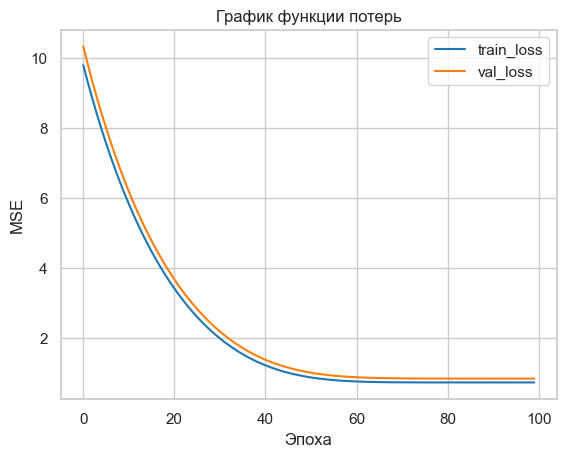

In [240]:
# Создание модели
model_1 = Sequential()

# Добавление слоя с 1 нейроном
model_1.add(tf.keras.layers.Dense(1, input_dim=X.shape[1]))

# Компиляция модели
model_1.compile(loss='mean_squared_error', optimizer='adam')

# Обучение модели
history = model_1.fit(X_train, y_train, epochs=100, batch_size=10, validation_data=(X_test, y_test))

# Предсказание на test
y_pred = model_1.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

# Построение графика функции потерь
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('График функции потерь')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()
plt.show()

Архитектура: 10-1

Epoch 1/50
72/72 [==============================] - 0s 2ms/step - loss: 7.1026 - val_loss: 6.2383
Epoch 2/50
72/72 [==============================] - 0s 1ms/step - loss: 4.8605 - val_loss: 4.2362
Epoch 3/50
72/72 [==============================] - 0s 998us/step - loss: 3.1615 - val_loss: 2.7163
Epoch 4/50
72/72 [==============================] - 0s 1ms/step - loss: 1.9301 - val_loss: 1.6720
Epoch 5/50
72/72 [==============================] - 0s 970us/step - loss: 1.1588 - val_loss: 1.0634
Epoch 6/50
72/72 [==============================] - 0s 1ms/step - loss: 0.8383 - val_loss: 0.8786
Epoch 7/50
72/72 [==============================] - 0s 955us/step - loss: 0.7695 - val_loss: 0.8502
Epoch 8/50
72/72 [==============================] - 0s 1ms/step - loss: 0.7530 - val_loss: 0.8395
Epoch 9/50
72/72 [==============================] - 0s 981us/step - loss: 0.7436 - val_loss: 0.8378
Epoch 10/50
72/72 [==============================] - 0s 1ms/step - loss: 0.7373 - val_loss: 0.8334
Epoch 11/50

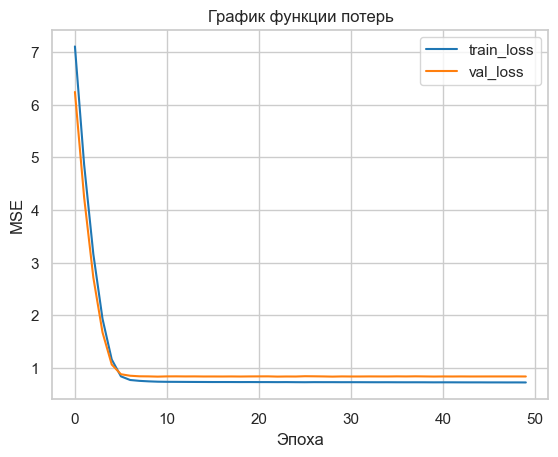

In [300]:
# Создание модели
model_10_1 = Sequential()

# Добавление скрытого слоя с 10 нейронами
model_10_1.add(Dense(10, input_dim=X.shape[1], activation='sigmoid'))

# Добавление выходного слоя с 1 нейроном
model_10_1.add(Dense(1))

# Компиляция модели
model_10_1.compile(loss='mean_squared_error', optimizer='rmsprop')

# Обучение модели
history = model_10_1.fit(X_train, y_train, epochs=50, batch_size=10, validation_data=(X_test, y_test))

# Предсказание на test
y_pred = model_10_1.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

# Построение графика функции потерь
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('График функции потерь')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()
plt.show()

## Подбор гиперпараметров с помощью hyperopt

In [276]:
# Определение функции objective, которая принимает словарь параметров для модели, строит и обучает модель
def objective(params):
    model = Sequential()
    model.add(Dense(params['units1'], input_dim=X_train.shape[1], activation=params['activation']))
    model.add(Dense(params['units2'], activation=params['activation']))
    model.add(Dense(1))
    model.compile(loss='mean_squared_error', optimizer=params['optimizer'])
    model.fit(X_train, y_train, epochs=params['epochs'], batch_size=params['batch_size'], verbose=0)
    loss = model.evaluate(X_test, y_test, verbose=0)
    
# Функция возвращает словарь с оценкой функции потерь (MSE) на тестовых данных
    return {'loss': loss, 'status': STATUS_OK}

# Определение пространства поиска параметров модели
space = {'units1': hp.choice('units1', range(8, 32)),
        'units2': hp.choice('units2', range(8, 32)),
        'batch_size': hp.choice('batch_size', [10, 16, 32, 64]),
        'epochs': hp.choice('epochs', [50, 100, 200]),
        'optimizer': hp.choice('optimizer', ['adam', 'sgd', 'rmsprop']),
        'activation': hp.choice('activation', ['relu', 'sigmoid', 'tanh'])
}
# Создание объекта Trials, который будет использоваться для сохранения истории запусков и результатов.
trials = Trials()

# Вызов функция fmin
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=100, trials=trials)

print('Лучшие параметры:', best)

100%|██████████| 100/100 [03:20<00:00,  2.01s/trial, best loss: 0.8173894882202148]
Лучшие параметры: {'activation': 1, 'batch_size': 3, 'epochs': 0, 'optimizer': 1, 'units1': 7, 'units2': 9}


Расшифровка лучших параметров:

activation = 'sigmoid'

batch_size = 64

epochs = 50

optimizer = 'sgd'

units1 = 20

units2 = 15

20-15-1

Epoch 1/50
12/12 [==============================] - 0s 8ms/step - loss: 6.3137 - val_loss: 1.8614
Epoch 2/50
12/12 [==============================] - 0s 2ms/step - loss: 1.1165 - val_loss: 0.8816
Epoch 3/50
12/12 [==============================] - 0s 3ms/step - loss: 0.7553 - val_loss: 0.8357
Epoch 4/50
12/12 [==============================] - 0s 2ms/step - loss: 0.7414 - val_loss: 0.8282
Epoch 5/50
12/12 [==============================] - 0s 2ms/step - loss: 0.7397 - val_loss: 0.8217
Epoch 6/50
12/12 [==============================] - 0s 3ms/step - loss: 0.7380 - val_loss: 0.8229
Epoch 7/50
12/12 [==============================] - 0s 2ms/step - loss: 0.7382 - val_loss: 0.8243
Epoch 8/50
12/12 [==============================] - 0s 3ms/step - loss: 0.7386 - val_loss: 0.8228
Epoch 9/50
12/12 [==============================] - 0s 3ms/step - loss: 0.7381 - val_loss: 0.8271
Epoch 10/50
12/12 [==============================] - 0s 2ms/step - loss: 0.7390 - val_loss: 0.8244
Epoch 11/50
12/12 [

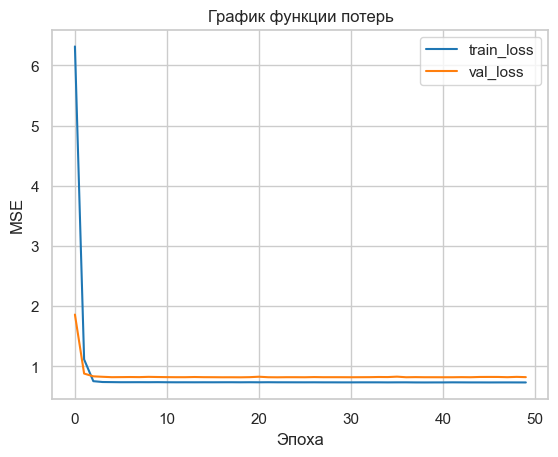

In [100]:
# Создание модели
model_20_15_1 = Sequential()
model_20_15_1.add(Dense(20, input_dim=X_train.shape[1], activation='sigmoid'))
model_20_15_1.add(Dense(15, activation='sigmoid'))
model_20_15_1.add(Dense(1))

# Компиляция модели
model_20_15_1.compile(loss='mean_squared_error', optimizer='sgd')

# Обучение модели
history = model_20_15_1.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test))

# Предсказание на test
y_pred = model_20_15_1.predict(X_test)

# Вычисление метрик качества
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Вывод метрик качества
print('MAE:', mae)
print('MSE:', mse)
print('Качество модели:', (1 - mae / y_train.mean()) * 100)
print('R2:', r2)

# Построение графика функции потерь
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='val_loss')
plt.title('График функции потерь')
plt.xlabel('Эпоха')
plt.ylabel('MSE')
plt.legend()
plt.show()

In [101]:
model_20_15_1.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_63 (Dense)            (None, 20)                220       
                                                                 
 dense_64 (Dense)            (None, 15)                315       
                                                                 
 dense_65 (Dense)            (None, 1)                 16        
                                                                 
Total params: 551
Trainable params: 551
Non-trainable params: 0
_________________________________________________________________


10/10 [==============================] - 0s 815us/step


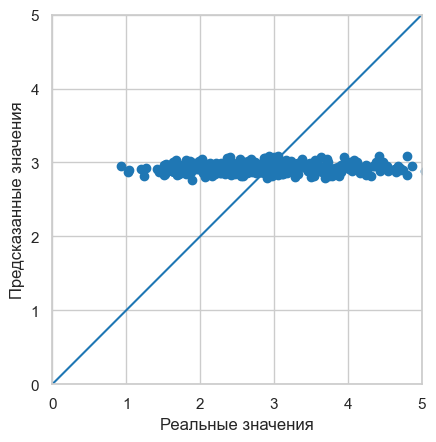

In [102]:
test_predictions = model_20_15_1.predict(X_test).flatten()

a = plt.axes(aspect = 'equal')
plt.scatter(y_test, test_predictions)
plt.xlabel('Реальные значения')
plt.ylabel('Предсказанные значения')
lims = [0, 5]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

Сохранение модели

In [103]:
# путь к папке, в которую будем сохранять модель
model_path = '../model_20_15_1'

# сохранение модели в формате SavedModel
model_20_15_1.save(model_path)

# проверка, что модель сохранена успешно
loaded_model = tf.keras.models.load_model(model_path)

INFO:tensorflow:Assets written to: ../model_20_15_1\assets


INFO:tensorflow:Assets written to: ../model_20_15_1\assets


In [92]:
pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.
